In [92]:
!pip install sentence_transformers

In [93]:
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

In [94]:
reviews = pd.read_csv('/content/Rbooks_df.csv')
#reviews.groupby('LABEL')
df=reviews[reviews['LABEL']=='__label2__']
df.reset_index(inplace=True)
df

,index,Unnamed: 0,DOC_ID,LABEL,RATING,VERIFIED_PURCHASE,PRODUCT_CATEGORY,PRODUCT_ID,PRODUCT_TITLE,REVIEW_TITLE,REVIEW_TEXT
0,350,10544,10545,__label2__,5,Y,Books,62202715,Nothing Gold Can Stay: Stories,"Interesting, Intriguing and Often Surprising",I enjoyed each and every one of these stories....
1,351,10589,10590,__label2__,5,Y,Books,B000MXSI04,Glock Pistols Disassembly & Reassembly Gun-gui...,Good item,"I personally don't own, or even like, the Gloc..."
2,352,10610,10611,__label2__,3,Y,Books,088347462X,Simple Changes,Inner Freedom,Wicks provides the reader with a relatively co...
3,353,10631,10632,__label2__,4,N,Books,1594204365,Year Zero: A History of 1945 (Ala Notable Book...,To begin again,"1945 is year zero, the year in which the real ..."
4,354,10665,10666,__label2__,5,N,Books,1423184629,Far From You,Great book for fans of Veronica Mars.,Sophie Winters is a drug addict. Everyone know...
...,...,...,...,...,...,...,...,...,...,...,...
345,695,20742,20743,__label2__,5,Y,Books,098514792X,Turning Tuscan: A Step-by-Step Guide to Going ...,It explained all about the people and the way ...,I loved the book. It was very interesting and...
346,696,20759,20760,__label2__,5,N,Books,553261215,"Boardwalk Jungle,the",Great info,Lots of info on the Philadelphia mob family of...
347,697,20773,20774,__label2__,2,N,Books,990722708,Bummed Out City,It was definitely different and something I wo...,A rep from the Artless Dodges Press contacted ...
348,698,20774,20775,__label2__,5,N,Books,849947022,Jesus: A Theography,Must read if your a Follower of Jesus,This book opened my eyes to so many connection...


In [95]:
sentences = df['REVIEW_TEXT']
sentences

0      I enjoyed each and every one of these stories....
1      I personally don't own, or even like, the Gloc...
2      Wicks provides the reader with a relatively co...
3      1945 is year zero, the year in which the real ...
4      Sophie Winters is a drug addict. Everyone know...
                             ...                        
345    I loved the book.  It was very interesting and...
346    Lots of info on the Philadelphia mob family of...
347    A rep from the Artless Dodges Press contacted ...
348    This book opened my eyes to so many connection...
349    I bought this to use as a daily journal that I...
Name: REVIEW_TEXT, Length: 350, dtype: object

In [96]:
model = SentenceTransformer('bert-base-nli-mean-tokens')

In [97]:
sentence_vecs = model.encode(sentences)

In [98]:
arr=cosine_similarity(sentence_vecs,sentence_vecs)

In [99]:
node_1 = []
node_2 = []
for u in range(0,350) :
    for v in range(0,350) :
        if u!=v and arr[u,v]>0.75:
            node_1.append(reviews['REVIEW_TITLE'].loc[u])
            node_2.append(reviews['REVIEW_TITLE'].loc[v])
        else:
            node_1.append(reviews['REVIEW_TITLE'].loc[u])
            node_2.append(1)

In [100]:
df1 = pd.DataFrame(list(zip(node_1, node_2)),
               columns =['Column1', 'Column2'])
df1

,Column1,Column2
0,Good book,1
1,Good book,1
2,Good book,1
3,Good book,1
4,Good book,1
...,...,...
122495,Flashcards Multistate Style,1
122496,Flashcards Multistate Style,1
122497,Flashcards Multistate Style,1
122498,Flashcards Multistate Style,1


In [101]:
import networkx as nx
G = nx.Graph()
import matplotlib.pyplot as plt

In [102]:
G = nx.from_pandas_edgelist(df1, 'Column1', 'Column2')

In [103]:
G.remove_node(1)

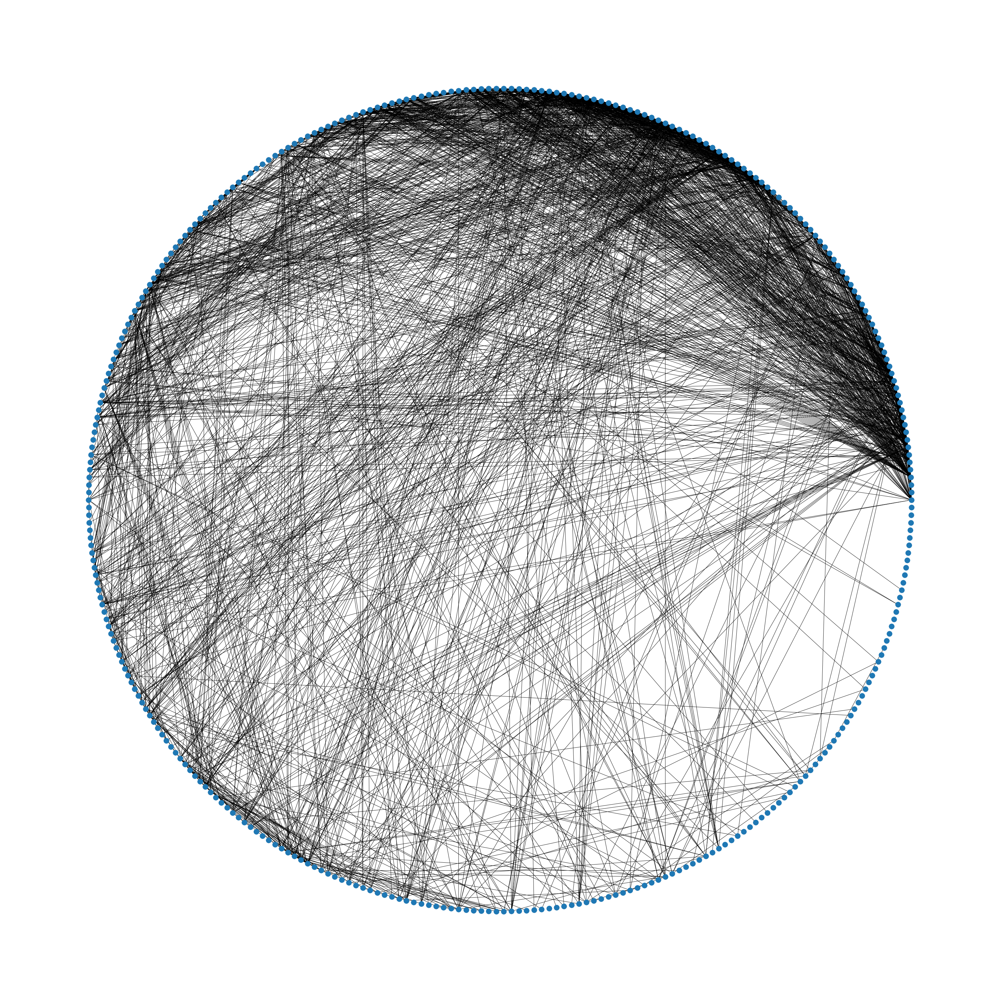

"nx.write_gml(G,'GCGraphREAL_0.75.gml')\nfrom google.colab import files\nfiles.download('GCGraphREAL_0.75.gml')"

In [104]:
from matplotlib.pyplot import figure
figure(figsize=(45,45))
nx.draw_circular(G)
plt.show()
'''nx.write_gml(G,'GCGraphREAL_0.75.gml')
from google.colab import files
files.download('GCGraphREAL_0.75.gml')'''

In [105]:
nx.density(G)

0.035653650254668934

In [106]:
nx.number_connected_components(G)

56

In [107]:
real=list(dict(G.degree()).values())
from statistics import mean
mean(real)

12.157894736842104

In [108]:
nx.average_clustering(G)

0.36343475661889807

In [109]:
nx.transitivity(G)

0.368917612517455